# Selection of gamma-ray compounds from aflowlib

In [1]:
import re
import os
import csv
import glob
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

pd.set_option('display.width', 1000)
pd.set_option('display.max_columns', 100)
pd.set_option('display.notebook_repr_html', True)

In [2]:
import seaborn as sns
import math
%matplotlib inline
plt.style.use('ggplot')

### Some data exploration

In [3]:
from urllib.request import urlopen
import json # preamble
import re
import os
import time

In [176]:
SERVER='http://aflowlib.duke.edu' # server name
PROJECT='AFLOWDATA/LIB2_RAW/' # project name
URL='http://aflowlib.duke.edu/AFLOWDATA/LIB2_RAW/?aflowlib_entries'
dwn = urlopen(URL).read().decode('utf-8').split(",")

print(len(dwn))
BRAVAIS = []
mlist = [14, 67, 119, 170, 633, 674, 220,271,320,366,412,462,506,550,592 ]
for i in mlist:
    BRAVAIS.append(dwn[i])
    
for i in range(714,752):
    BRAVAIS.append(dwn[i])

1528


In [178]:
df = pd.read_csv("aflow_icsd_"+BRAVAIS[0]+".csv")
for brav in range(1,len(BRAVAIS)):
    df_buf = pd.read_csv("aflow_icsd_"+BRAVAIS[brav]+".csv")
    df = pd.concat([df,df_buf],ignore_index=True)
    print ("Done "+BRAVAIS[brav])

Done AlFe_pv
Done AsFe_pv
Done AuFe_pv
Done Cr_pvFe_pv
Done Cu_pvFe_pv
Done B_hFe_pv
Done Ba_svFe_pv
Done Be_svFe_pv
Done Bi_dFe_pv
Done BrFe_pv
Done Ca_svFe_pv
Done CdFe_pv
Done ClFe_pv


/Users/moshiour/anaconda/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2717: DtypeWarning: Columns (5,48,63) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


Done CoFe_pv
Done Fe_pvGa_h
Done Fe_pvGe_h


/Users/moshiour/anaconda/lib/python3.5/site-packages/IPython/core/interactiveshell.py:2717: DtypeWarning: Columns (45) have mixed types. Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


Done Fe_pvHf_pv
Done Fe_pvHg
Done Fe_pvIn_d
Done Fe_pvIr
Done Fe_pvK_sv
Done Fe_pvLa
Done Fe_pvLi_sv
Done Fe_pvMg_pv
Done Fe_pvMn_pv
Done Fe_pvMo_pv
Done Fe_pvNa_sv
Done Fe_pvNb_sv
Done Fe_pvNi_pv
Done Fe_pvOs_pv
Done Fe_pvP
Done Fe_pvPb_d
Done Fe_pvPd_pv
Done Fe_pvPt
Done Fe_pvRe_pv
Done Fe_pvRh_pv
Done Fe_pvRu_pv
Done Fe_pvSb
Done Fe_pvSc_sv
Done Fe_pvSe
Done Fe_pvSi
Done Fe_pvSn
Done Fe_pvSr_sv
Done Fe_pvTa_pv
Done Fe_pvTc_pv
Done Fe_pvTe
Done Fe_pvTi_sv
Done Fe_pvTl_d
Done Fe_pvV_sv
Done Fe_pvW_pv
Done Fe_pvY_sv
Done Fe_pvZn


In [179]:
df.tail()

,Bravais_lattice_orig,Bravais_lattice_relax,Egap,Egap_fit,Egap_type,PV_atom,PV_cell,Pearson_symbol_orig,Pearson_symbol_relax,Unnamed: 0,aapi,aflow_version,aflowlib_date,aflowlib_version,auid,aurl,calculation_cores,calculation_memory,calculation_time,code,composition,compound,data_api,data_source,density,dft_type,eentropy_atom,eentropy_cell,energy_atom,energy_cell,enthalpy_atom,enthalpy_cell,enthalpy_formation_atom,enthalpy_formation_cell,entropic_temperature,files,forces,geometry,keywords,lattice_system_orig,lattice_system_relax,lattice_variation_orig,lattice_variation_relax,loop,natoms,nbondxx,node_CPU_Cores,node_CPU_MHz,node_CPU_Model,node_RAM_GB,nspecies,positions_cartesian,pressure,prototype,scintillation_attenuation_length,sg,sg2,spacegroup_orig,spacegroup_relax,species,species_pp,species_pp_ZVAL,species_pp_version,spinD,spinF,spin_atom,spin_cell,stoich,stoichiometry,valence_cell_iupac,valence_cell_std,volume_atom,volume_cell
258864,MCLC,MCLC,NaN,NaN,NaN,0,0,mS28,mS28,14,1,aflow30772,20160611_07:48:48_GMT-5,31029,aflow:b15ea855c5cdb620,aflowlib.duke.edu:AFLOWDATA/LIB2_RAW/Fe_pvZn/I...,12,1944.01,1970-01-01 02:18:02.080000,vasp.4.6.35,"1,13",Fe1Zn13,aapi1.1,aflowlib,7.38229,PAW_PBE,0.000012,0.000169,-1.80872,-25.3221,-1.80872,-25.3221,-0.029617,-0.414641,1335.67,POSCAR.relax2,"-0,0,0;-0,-0,0;0,-0.003721,-0.006608;0,0.00372...","6.602871,6.602871,5.050652,81.27766,81.27766,7...","aurl,auid,data_api,data_source,loop,code,compo...",monoclinic,monoclinic,MCLC1,MCLC1,"lock,thermodynamics",14,"2.0687,1.0343,1.052",12.0,2660.0,Intel(R)_Xeon(R)_CPU__X5650_@_2.67GHz,24.0,2,"-0,0.4707,2.48107;0,-0,-0;0,6.69347,0.31592;0,...",0,ICSD_163222.AB,1.6616,"C2/m #12,C2/m #12,C2/m #12","C2/m #12,C2/m #12,C2/m #12",12,12,"Fe,Zn","Fe_pv,Zn","14,12","Fe_pv:PAW_PBE:06Sep2000,Zn:PAW_PBE:06Sep2000",NaN,NaN,0.0,0.0,0.0714 0.9286,"0.0714285714,0.928571429",32,164,14.5531,203.744
258865,MCLC,MCLC,NaN,NaN,NaN,0,0,mS28,mS28,15,1,aflow30772,20160611_07:48:48_GMT-5,31029,aflow:b15ea855c5cdb620,aflowlib.duke.edu:AFLOWDATA/LIB2_RAW/Fe_pvZn/I...,12,1944.01,1970-01-01 02:18:02.080000,vasp.4.6.35,"1,13",Fe1Zn13,aapi1.1,aflowlib,7.38229,PAW_PBE,0.000012,0.000169,-1.80872,-25.3221,-1.80872,-25.3221,-0.029617,-0.414641,1335.67,aflow.in,"-0,0,0;-0,-0,0;0,-0.003721,-0.006608;0,0.00372...","6.602871,6.602871,5.050652,81.27766,81.27766,7...","aurl,auid,data_api,data_source,loop,code,compo...",monoclinic,monoclinic,MCLC1,MCLC1,"lock,thermodynamics",14,"2.0687,1.0343,1.052",12.0,2660.0,Intel(R)_Xeon(R)_CPU__X5650_@_2.67GHz,24.0,2,"-0,0.4707,2.48107;0,-0,-0;0,6.69347,0.31592;0,...",0,ICSD_163222.AB,1.6616,"C2/m #12,C2/m #12,C2/m #12","C2/m #12,C2/m #12,C2/m #12",12,12,"Fe,Zn","Fe_pv,Zn","14,12","Fe_pv:PAW_PBE:06Sep2000,Zn:PAW_PBE:06Sep2000",NaN,NaN,0.0,0.0,0.0714 0.9286,"0.0714285714,0.928571429",32,164,14.5531,203.744
258866,MCLC,MCLC,NaN,NaN,NaN,0,0,mS28,mS28,16,1,aflow30772,20160611_07:48:48_GMT-5,31029,aflow:b15ea855c5cdb620,aflowlib.duke.edu:AFLOWDATA/LIB2_RAW/Fe_pvZn/I...,12,1944.01,1970-01-01 02:18:02.080000,vasp.4.6.35,"1,13",Fe1Zn13,aapi1.1,aflowlib,7.38229,PAW_PBE,0.000012,0.000169,-1.80872,-25.3221,-1.80872,-25.3221,-0.029617,-0.414641,1335.67,aflow.qmvasp.out,"-0,0,0;-0,-0,0;0,-0.003721,-0.006608;0,0.00372...","6.602871,6.602871,5.050652,81.27766,81.27766,7...","aurl,auid,data_api,data_source,loop,code,compo...",monoclinic,monoclinic,MCLC1,MCLC1,"lock,thermodynamics",14,"2.0687,1.0343,1.052",12.0,2660.0,Intel(R)_Xeon(R)_CPU__X5650_@_2.67GHz,24.0,2,"-0,0.4707,2.48107;0,-0,-0;0,6.69347,0.31592;0,...",0,ICSD_163222.AB,1.6616,"C2/m #12,C2/m #12,C2/m #12","C2/m #12,C2/m #12,C2/m #12",12,12,"Fe,Zn","Fe_pv,Zn","14,12","Fe_pv:PAW_PBE:06Sep2000,Zn:PAW_PBE:06Sep2000",NaN,NaN,0.0,0.0,0.0714 0.9286,"0.0714285714,0.928571429",32,164,14.5531,203.744
258867,MCLC,MCLC,NaN,NaN,NaN,0,0,mS28,mS28,17,1,aflow30772,20160611_07:48:48_GMT-5,31029,aflow:b15ea855c5cdb620,aflowlib.duke.edu:AFLOWDATA/LIB2_RAW/Fe_pvZn/I...,12,1944.01,1970-01-01 02:18:02.080000,vasp.4.6.35,"1,13",Fe1Zn1

In [180]:
#features = ['prototype','files','density','Egap','species_pp','geometry','positions_cartesian']

print(df.columns.values)

df.tail(5)

['Bravais_lattice_orig' 'Bravais_lattice_relax' 'Egap' 'Egap_fit'
 'Egap_type' 'PV_atom' 'PV_cell' 'Pearson_symbol_orig'
 'Pearson_symbol_relax' 'Unnamed: 0' 'aapi' 'aflow_version' 'aflowlib_date'
 'aflowlib_version' 'auid' 'aurl' 'calculation_cores' 'calculation_memory'
 'calculation_time' 'code' 'composition' 'compound' 'data_api'
 'data_source' 'density' 'dft_type' 'eentropy_atom' 'eentropy_cell'
 'energy_atom' 'energy_cell' 'enthalpy_atom' 'enthalpy_cell'
 'enthalpy_formation_atom' 'enthalpy_formation_cell' 'entropic_temperature'
 'files' 'forces' 'geometry' 'keywords' 'lattice_system_orig'
 'lattice_system_relax' 'lattice_variation_orig' 'lattice_variation_relax'
 'loop' 'natoms' 'nbondxx' 'node_CPU_Cores' 'node_CPU_MHz' 'node_CPU_Model'
 'node_RAM_GB' 'nspecies' 'positions_cartesian' 'pressure' 'prototype'
 'scintillation_attenuation_length' 'sg' 'sg2' 'spacegroup_orig'
 'spacegroup_relax' 'species' 'species_pp' 'species_pp_ZVAL'
 'species_pp_version' 'spinD' 'spinF' 'spin_atom' 

,Bravais_lattice_orig,Bravais_lattice_relax,Egap,Egap_fit,Egap_type,PV_atom,PV_cell,Pearson_symbol_orig,Pearson_symbol_relax,Unnamed: 0,aapi,aflow_version,aflowlib_date,aflowlib_version,auid,aurl,calculation_cores,calculation_memory,calculation_time,code,composition,compound,data_api,data_source,density,dft_type,eentropy_atom,eentropy_cell,energy_atom,energy_cell,enthalpy_atom,enthalpy_cell,enthalpy_formation_atom,enthalpy_formation_cell,entropic_temperature,files,forces,geometry,keywords,lattice_system_orig,lattice_system_relax,lattice_variation_orig,lattice_variation_relax,loop,natoms,nbondxx,node_CPU_Cores,node_CPU_MHz,node_CPU_Model,node_RAM_GB,nspecies,positions_cartesian,pressure,prototype,scintillation_attenuation_length,sg,sg2,spacegroup_orig,spacegroup_relax,species,species_pp,species_pp_ZVAL,species_pp_version,spinD,spinF,spin_atom,spin_cell,stoich,stoichiometry,valence_cell_iupac,valence_cell_std,volume_atom,volume_cell
258864,MCLC,MCLC,NaN,NaN,NaN,0,0,mS28,mS28,14,1,aflow30772,20160611_07:48:48_GMT-5,31029,aflow:b15ea855c5cdb620,aflowlib.duke.edu:AFLOWDATA/LIB2_RAW/Fe_pvZn/I...,12,1944.01,1970-01-01 02:18:02.080000,vasp.4.6.35,"1,13",Fe1Zn13,aapi1.1,aflowlib,7.38229,PAW_PBE,0.000012,0.000169,-1.80872,-25.3221,-1.80872,-25.3221,-0.029617,-0.414641,1335.67,POSCAR.relax2,"-0,0,0;-0,-0,0;0,-0.003721,-0.006608;0,0.00372...","6.602871,6.602871,5.050652,81.27766,81.27766,7...","aurl,auid,data_api,data_source,loop,code,compo...",monoclinic,monoclinic,MCLC1,MCLC1,"lock,thermodynamics",14,"2.0687,1.0343,1.052",12.0,2660.0,Intel(R)_Xeon(R)_CPU__X5650_@_2.67GHz,24.0,2,"-0,0.4707,2.48107;0,-0,-0;0,6.69347,0.31592;0,...",0,ICSD_163222.AB,1.6616,"C2/m #12,C2/m #12,C2/m #12","C2/m #12,C2/m #12,C2/m #12",12,12,"Fe,Zn","Fe_pv,Zn","14,12","Fe_pv:PAW_PBE:06Sep2000,Zn:PAW_PBE:06Sep2000",NaN,NaN,0.0,0.0,0.0714 0.9286,"0.0714285714,0.928571429",32,164,14.5531,203.744
258865,MCLC,MCLC,NaN,NaN,NaN,0,0,mS28,mS28,15,1,aflow30772,20160611_07:48:48_GMT-5,31029,aflow:b15ea855c5cdb620,aflowlib.duke.edu:AFLOWDATA/LIB2_RAW/Fe_pvZn/I...,12,1944.01,1970-01-01 02:18:02.080000,vasp.4.6.35,"1,13",Fe1Zn13,aapi1.1,aflowlib,7.38229,PAW_PBE,0.000012,0.000169,-1.80872,-25.3221,-1.80872,-25.3221,-0.029617,-0.414641,1335.67,aflow.in,"-0,0,0;-0,-0,0;0,-0.003721,-0.006608;0,0.00372...","6.602871,6.602871,5.050652,81.27766,81.27766,7...","aurl,auid,data_api,data_source,loop,code,compo...",monoclinic,monoclinic,MCLC1,MCLC1,"lock,thermodynamics",14,"2.0687,1.0343,1.052",12.0,2660.0,Intel(R)_Xeon(R)_CPU__X5650_@_2.67GHz,24.0,2,"-0,0.4707,2.48107;0,-0,-0;0,6.69347,0.31592;0,...",0,ICSD_163222.AB,1.6616,"C2/m #12,C2/m #12,C2/m #12","C2/m #12,C2/m #12,C2/m #12",12,12,"Fe,Zn","Fe_pv,Zn","14,12","Fe_pv:PAW_PBE:06Sep2000,Zn:PAW_PBE:06Sep2000",NaN,NaN,0.0,0.0,0.0714 0.9286,"0.0714285714,0.928571429",32,164,14.5531,203.744
258866,MCLC,MCLC,NaN,NaN,NaN,0,0,mS28,mS28,16,1,aflow30772,20160611_07:48:48_GMT-5,31029,aflow:b15ea855c5cdb620,aflowlib.duke.edu:AFLOWDATA/LIB2_RAW/Fe_pvZn/I...,12,1944.01,1970-01-01 02:18:02.080000,vasp.4.6.35,"1,13",Fe1Zn13,aapi1.1,aflowlib,7.38229,PAW_PBE,0.000012,0.000169,-1.80872,-25.3221,-1.80872,-25.3221,-0.029617,-0.414641,1335.67,aflow.qmvasp.out,"-0,0,0;-0,-0,0;0,-0.003721,-0.006608;0,0.00372...","6.602871,6.602871,5.050652,81.27766,81.27766,7...","aurl,auid,data_api,data_source,loop,code,compo...",monoclinic,monoclinic,MCLC1,MCLC1,"lock,thermodynamics",14,"2.0687,1.0343,1.052",12.0,2660.0,Intel(R)_Xeon(R)_CPU__X5650_@_2.67GHz,24.0,2,"-0,0.4707,2.48107;0,-0,-0;0,6.69347,0.31592;0,...",0,ICSD_163222.AB,1.6616,"C2/m #12,C2/m #12,C2/m #12","C2/m #12,C2/m #12,C2/m #12",12,12,"Fe,Zn","Fe_pv,Zn","14,12","Fe_pv:PAW_PBE:06Sep2000,Zn:PAW_PBE:06Sep2000",NaN,NaN,0.0,0.0,0.0714 0.9286,"0.0714285714,0.928571429",32,164,14.5531,203.744
258867,MCLC,MCLC,NaN,NaN,NaN,0,0,mS28,mS28,17,1,aflow30772,20160611_07:48:48_GMT-5,31029,aflow:b15ea855c5cdb620,aflowlib.duke.edu:AFLOWDATA/LIB2_RAW/Fe_pvZn/I...,12,1944.01,1970-01-01 02:18:02.080000,vasp.4.6.35,"1,13",Fe1Zn1

In [181]:
print ('Total number of entries in the data set:'),  df.shape[0]

Total number of entries in the data set:


(None, 258869)

In [253]:
features = ['compound','composition','density','energy_atom','enthalpy_formation_atom','natoms',
           'nspecies','species','spin_atom','stoichiometry','species_pp_ZVAL','valence_cell_std','volume_atom']
dfa = df[features]

In [254]:
dfa.head()

,compound,composition,density,energy_atom,enthalpy_formation_atom,natoms,nspecies,species,spin_atom,stoichiometry,species_pp_ZVAL,valence_cell_std,volume_atom
0,Fe1,1,8.85851,-8.29881,0.155943,1,1,Fe,0.921567,1,14,8,10.4686
1,Fe1,1,8.85851,-8.29881,0.155943,1,1,Fe,0.921567,1,14,8,10.4686
2,Fe1,1,8.85851,-8.29881,0.155943,1,1,Fe,0.921567,1,14,8,10.4686
3,Fe1,1,8.85851,-8.29881,0.155943,1,1,Fe,0.921567,1,14,8,10.4686
4,Fe1,1,8.85851,-8.29881,0.155943,1,1,Fe,0.921567,1,14,8,10.4686


In [255]:
dfa=dfa.drop_duplicates(['energy_atom'])
dfa.head()

,compound,composition,density,energy_atom,enthalpy_formation_atom,natoms,nspecies,species,spin_atom,stoichiometry,species_pp_ZVAL,valence_cell_std,volume_atom
0,Fe1,1,8.85851,-8.29881,0.155943,1,1,Fe,0.921567,1,14,8,10.4686
19,Ag2Fe1,"2,1",9.29710,-4.41071,0.292662,3,2,"Ag,Fe",0.963026,"0.666666667,0.333333333","11,14",30,16.1690
38,Ag1Fe3,"1,3",8.48051,-6.70721,0.340776,4,2,"Ag,Fe",2.000280,"0.25,0.75","11,14",35,13.4817
57,Fe2,2,7.74657,-8.26798,0.186767,2,1,Fe,2.557380,1,14,16,11.9713
76,Ag1Fe1,"1,1",8.96160,-5.23650,0.404718,2,2,"Ag,Fe",1.410700,"0.5,0.5","11,14",19,15.1678


In [284]:
cdf=dfa['stoichiometry'].str.split(',', 2, expand=True).rename(columns={0:'cx', 1:'cy'})
cdf.tail()

,cx,cy
258679,0.333333333,0.666666667
258717,1,None
258812,1,None
258831,1,None
258850,0.0714285714,0.928571429


In [285]:
cdf=cdf.fillna(0)

In [286]:
cdf['cx']=cdf['cx'].astype(float)
cdf['cy']=cdf['cy'].astype(float)

In [287]:
dfb = pd.concat([dfa,cdf],axis=1)
dfb.tail()

,compound,composition,density,energy_atom,enthalpy_formation_atom,natoms,nspecies,species,spin_atom,stoichiometry,species_pp_ZVAL,valence_cell_std,volume_atom,cx,cy
258679,Fe1Zn2,"1,2",7.63690,-3.61293,0.049046,3,2,"Fe,Zn",0.76349,"0.333333333,0.666666667","14,12",32,13.5251,0.333333,0.666667
258717,Zn2,2,7.17358,-1.24370,0.021885,2,1,Zn,0.00000,1,12,24,15.1342,1.000000,0.000000
258812,Fe2,2,9.10054,-8.37341,0.081337,2,1,Fe,0.00000,1,14,16,10.1902,1.000000,0.000000
258831,Zn2,2,7.14976,-1.26541,0.000177,2,1,Zn,0.00000,1,12,24,15.1846,1.000000,0.000000
258850,Fe1Zn13,"1,13",7.38229,-1.80872,-0.029617,14,2,"Fe,Zn",0.00000,"0.0714285714,0.928571429","14,12",164,14.5531,0.071429,0.928571


In [288]:
def func(row):
    if (row['species'] == 'Cu'):
        a = row['cy']
    elif (row['species'] == 'Cu,Fe'):
        a = row['cy']
    elif (row['species'] == 'Ag'):
        a = row['cy']
    elif (row['species'] == 'Ag,Fe'):
        a = row['cy']
    elif (row['species'] == 'Au'):
        a = row['cy']
    elif (row['species'] == 'Au,Fe'):
        a = row['cy']
    elif (row['species'] == 'As'):
        a = row['cy']
    elif (row['species'] == 'As,Fe'):
        a = row['cy']
    elif (row['species'] == 'Co'):
        a = row['cy']
    elif (row['species'] == 'Co,Fe'):
        a = row['cy']
    elif (row['species'] == 'Cr'):
        a = row['cy']
    elif (row['species'] == 'Cr,Fe'):
        a = row['cy']
    elif (row['species'] == 'Al'):
        a = row['cy']
    elif (row['species'] == 'Al,Fe'):
        a = row['cy']
    elif (row['species'] == 'B'):
        a = row['cy']
    elif (row['species'] == 'B,Fe'):
        a = row['cy']
    elif (row['species'] == 'Ba'):
        a = row['cy']
    elif (row['species'] == 'Ba,Fe'):
        a = row['cy']
    elif (row['species'] == 'Be'):
        a = row['cy']
    elif (row['species'] == 'Be,Fe'):
        a = row['cy']
    elif (row['species'] == 'Bi'):
        a = row['cy']
    elif (row['species'] == 'Bi,Fe'):
        a = row['cy']
    elif (row['species'] == 'Br'):
        a = row['cy']
    elif (row['species'] == 'Br,Fe'):
        a = row['cy']
    elif (row['species'] == 'Ca'):
        a = row['cy']
    elif (row['species'] == 'Ca,Fe'):
        a = row['cy']
    elif (row['species'] == 'Cd'):
        a = row['cy']
    elif (row['species'] == 'Cd,Fe'):
        a = row['cy']
    elif (row['species'] == 'Cl'):
        a = row['cy']
    elif (row['species'] == 'Cl,Fe'):
        a = row['cy']
    else:
        a = row['cx']
    return a

In [289]:
dfb['xFe'] = dfb.apply(func, axis=1)

In [290]:
dfb.tail()

,compound,composition,density,energy_atom,enthalpy_formation_atom,natoms,nspecies,species,spin_atom,stoichiometry,species_pp_ZVAL,valence_cell_std,volume_atom,cx,cy,xFe
258679,Fe1Zn2,"1,2",7.63690,-3.61293,0.049046,3,2,"Fe,Zn",0.76349,"0.333333333,0.666666667","14,12",32,13.5251,0.333333,0.666667,0.333333
258717,Zn2,2,7.17358,-1.24370,0.021885,2,1,Zn,0.00000,1,12,24,15.1342,1.000000,0.000000,1.000000
258812,Fe2,2,9.10054,-8.37341,0.081337,2,1,Fe,0.00000,1,14,16,10.1902,1.000000,0.000000,1.000000
258831,Zn2,2,7.14976,-1.26541,0.000177,2,1,Zn,0.00000,1,12,24,15.1846,1.000000,0.000000,1.000000
258850,Fe1Zn13,"1,13",7.38229,-1.80872,-0.029617,14,2,"Fe,Zn",0.00000,"0.0714285714,0.928571429","14,12",164,14.5531,0.071429,0.928571,0.071429


In [263]:
dfb.ix[(dfb.species=='Al') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='Cu') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='Cr') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='Ni') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='Co') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='Mn') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='Mo') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='Nb') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='Hf') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='As') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='Au') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='Ag') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='W') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='V') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='Ti') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='Hg') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='As') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='Os') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='In') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='Ir') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='K') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='La') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='Si') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='Se') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='Sb') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='Te') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='Y') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='Re') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='Rh') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='Sn') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='Sr') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='P') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='Pb') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='Pd') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='Ta') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0
dfb.ix[(dfb.species=='Tc') & (dfb.enthalpy_formation_atom <=0.0),'enthalpy_formation_atom']=0.0

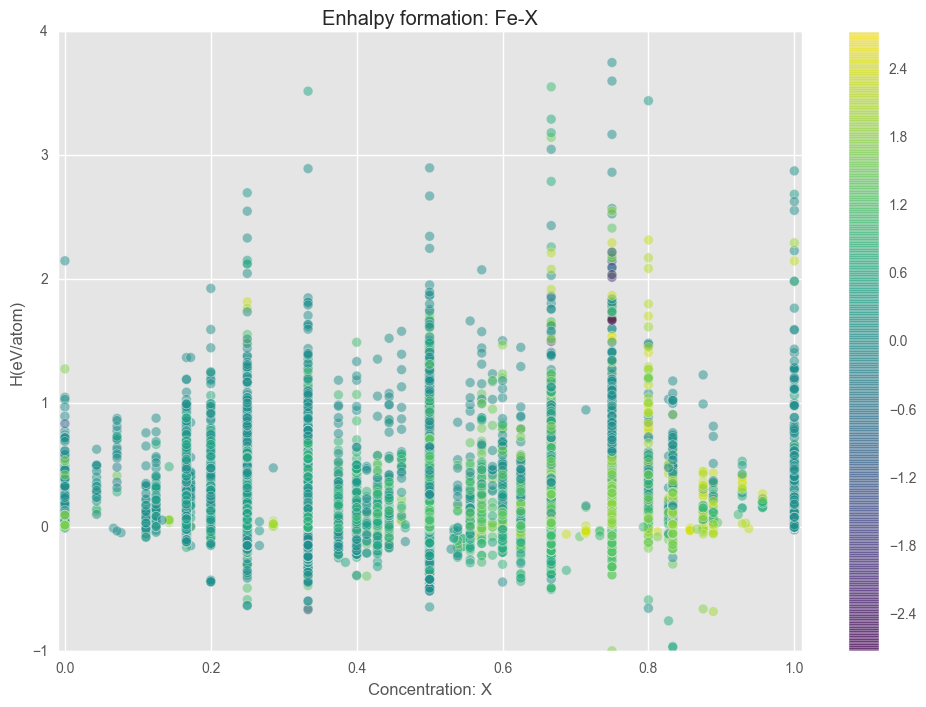

In [194]:
plt.figure().set_size_inches(12, 8)
plt.scatter(x=dfb['xFe'],y=dfb['enthalpy_formation_atom'],
                     c=dfb['spin_atom'],cmap='viridis', s=50,alpha=0.5)

plt.ylim(-1, 4)
plt.xlim(-0.01, 1.01)
plt.title('Enhalpy formation: Fe-X')
plt.ylabel('H(eV/atom)')
plt.xlabel('Concentration: X')
plt.colorbar()
plt.savefig('eform_Fe.png',dpi=500,format='PNG')

In [195]:
dfe = dfb[['enthalpy_formation_atom','xFe','volume_atom','density','spin_atom','valence_cell_std']]

In [196]:
dff = dfe[(dfe['enthalpy_formation_atom'] <= 2.0) & (dfe['enthalpy_formation_atom'] >= -0.8)]

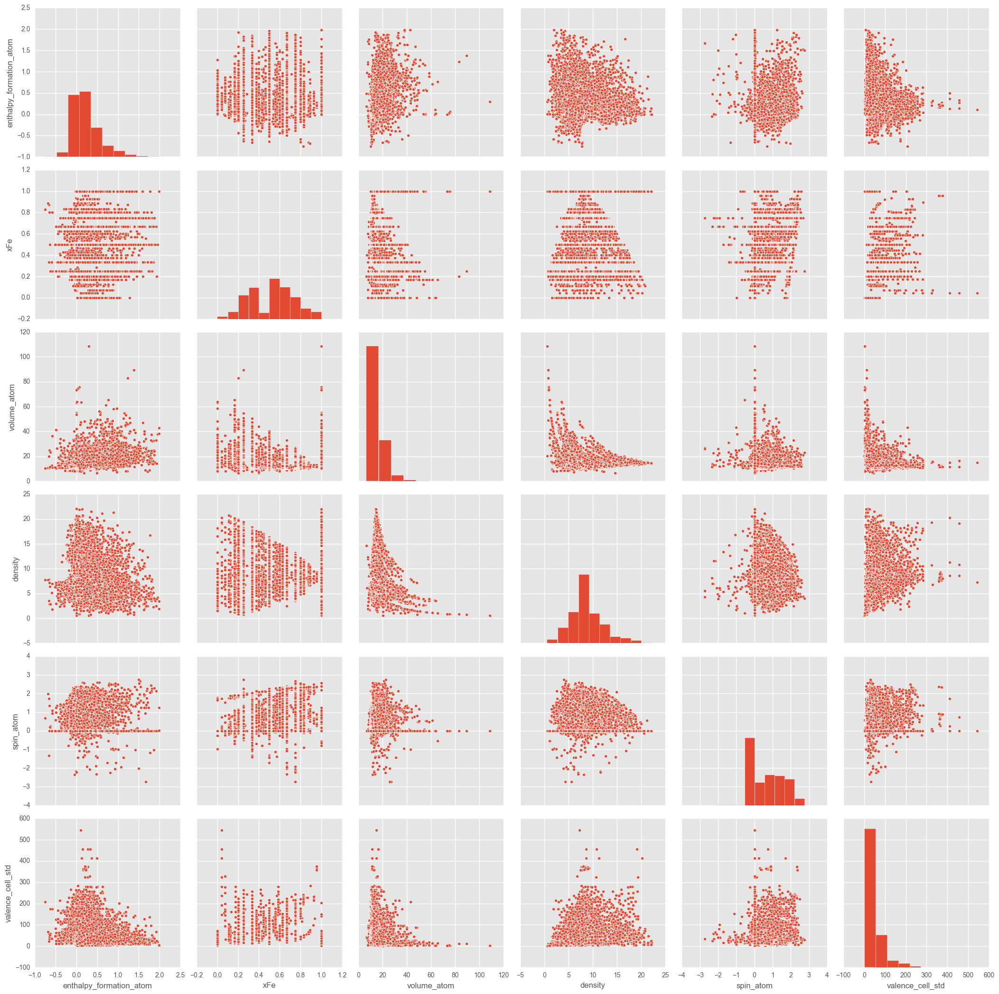

In [197]:
sns.pairplot(dff, palette="coolwarm",size=3.5)

In [361]:
u = dff.iloc[:,1:6].values
v = dff['enthalpy_formation_atom'].ravel()

In [362]:
u.shape

(12399, 5)

In [199]:
ymin = -0.7; ymax = 2.0

score: 0.907460900549


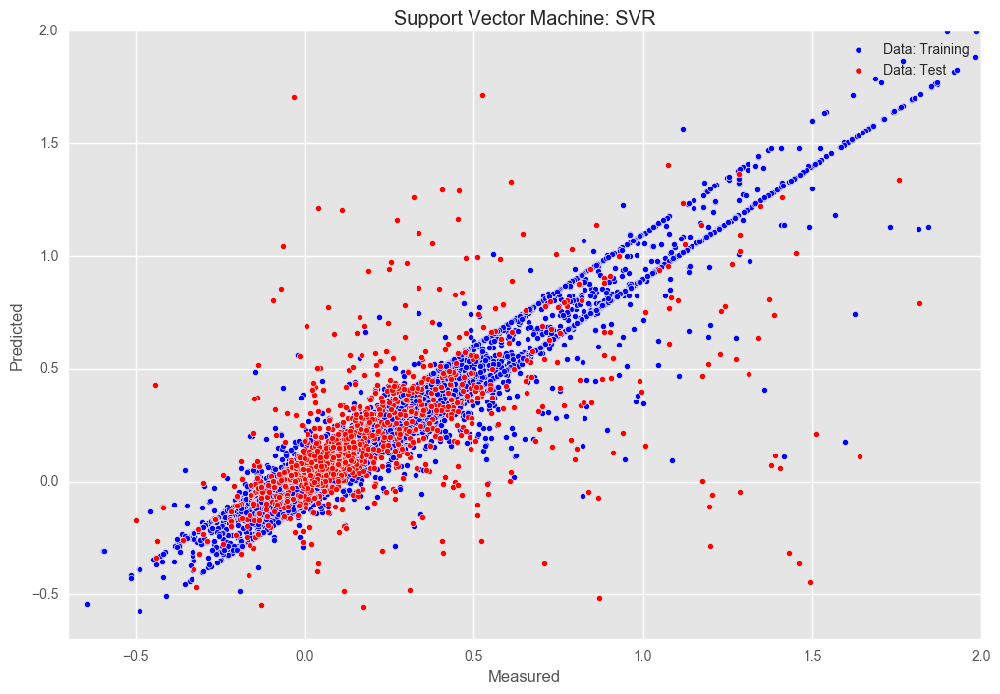

In [138]:
# Support vector machine

from sklearn.svm import SVR

import matplotlib.pyplot as plt
from sklearn.cross_validation import train_test_split

X_train, X_test, y_train, y_test = train_test_split(u, v, test_size=0.10, random_state=7)
#############################################################################
# Fit regression model
svr = SVR(kernel='rbf', C=1e3, gamma=0.1,epsilon=0.1,cache_size=500)

svr.fit(X_train, y_train)

y_svr = svr.predict(X_train)

y_svrt = svr.predict(X_test)

scr = svr.score(X_train, y_train, sample_weight=None)
print('score:',scr)
######################################
# Plot
plt.figure().set_size_inches(12, 8)
plt.scatter(y_train, y_svr,c='b',label='Data: Training')
plt.scatter(y_test, y_svrt,c='r' ,label='Data: Test')
plt.xlabel('Measured')
plt.ylabel('Predicted')
plt.title("Support Vector Machine: SVR")
plt.ylim(ymin, ymax)
plt.xlim(ymin, ymax)
plt.legend()

/Users/moshiour/anaconda/lib/python3.5/site-packages/sklearn/learning_curve.py:23: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the functions are moved. This module will be removed in 0.20
  DeprecationWarning)


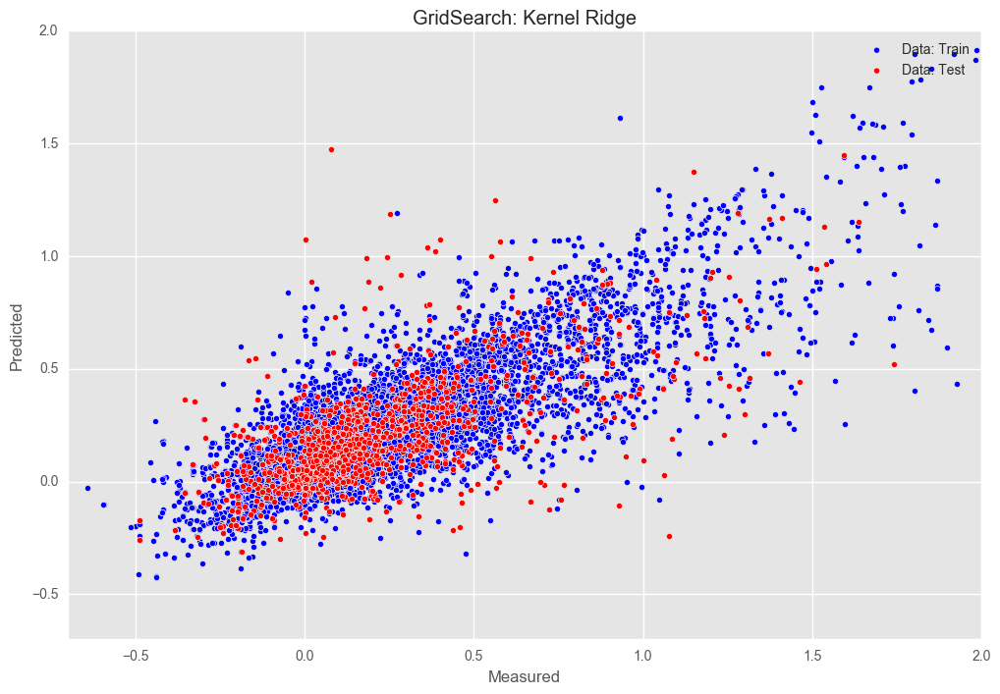

In [139]:
# Machine learning 

from sklearn.model_selection import GridSearchCV
from sklearn.learning_curve import learning_curve
from sklearn.kernel_ridge import KernelRidge
import matplotlib.pyplot as plt
from sklearn.cross_validation import train_test_split

X_train, X_test, y_train, y_test = train_test_split(u, v, test_size=0.10, random_state=0)

kr = GridSearchCV(KernelRidge(kernel='rbf', gamma=0.09), cv=10,
                  param_grid={"alpha": [1e0, 1e-2, 1e-3],
                              "gamma": np.logspace(-5, 2, 5)})

kr.fit(X_train, y_train)

y_kr = kr.predict(X_train)
y_krt = kr.predict(X_test)
############################
#plot
plt.figure().set_size_inches(12, 8)
plt.scatter(y_train, y_kr,c='b',label='Data: Train')
plt.scatter(y_test, y_krt,c='r' ,label='Data: Test')
plt.xlabel('Measured')
plt.ylabel('Predicted')
plt.title("GridSearch: Kernel Ridge")
plt.ylim(ymin, ymax)
plt.xlim(ymin, ymax)
plt.legend()

score: 0.999999999171


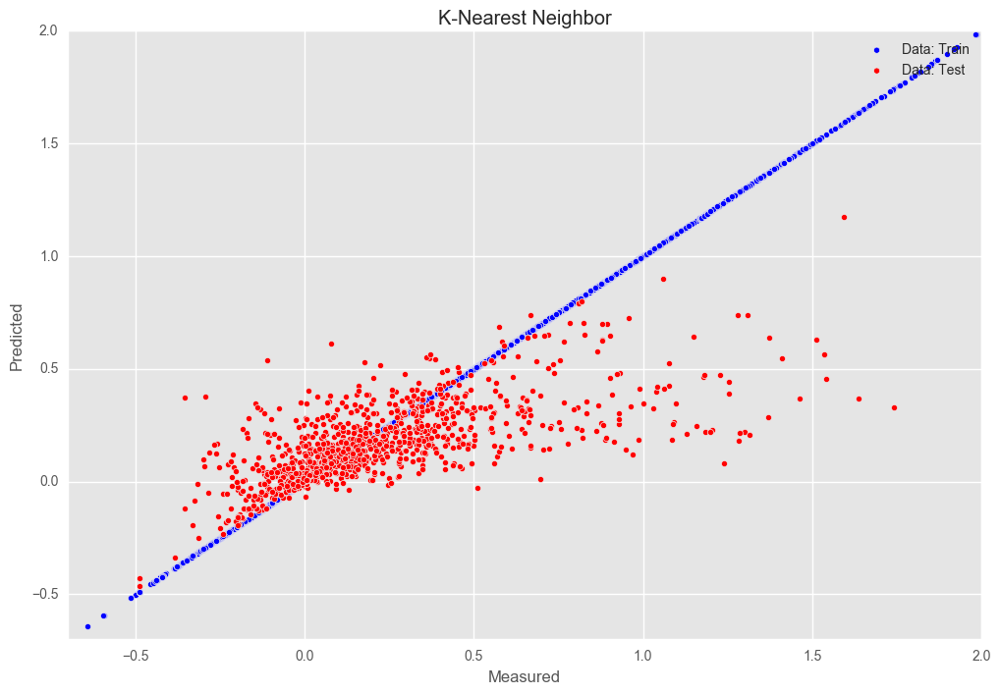

In [135]:
from sklearn import neighbors
from sklearn.cross_validation import train_test_split

X_train, X_test, y_train, y_test = train_test_split(u, v, test_size=0.10, random_state=0)

n_neighbors = 90
knnd = neighbors.KNeighborsRegressor(n_neighbors, weights='distance',algorithm='kd_tree',leaf_size=50, p=2, metric='minkowski')

y_pd = knnd.fit(X_train, y_train).predict(X_train)
y_pdt = knnd.predict(X_test)

scr = knnd.score(X_train, y_train, sample_weight=None)
print('score:',scr)
# Plot the results
plt.figure().set_size_inches(12, 8)
plt.scatter(y_train, y_pd, c='b',label='Data: Training')
plt.scatter(y_test, y_pdt, c='r' ,label='Data: Test')

plt.xlabel('Measured')
plt.ylabel('Predicted')
plt.title('K-Nearest Neighbor')
plt.ylim(ymin, ymax)
plt.xlim(ymin, ymax)
plt.legend()

score: 0.958588796568


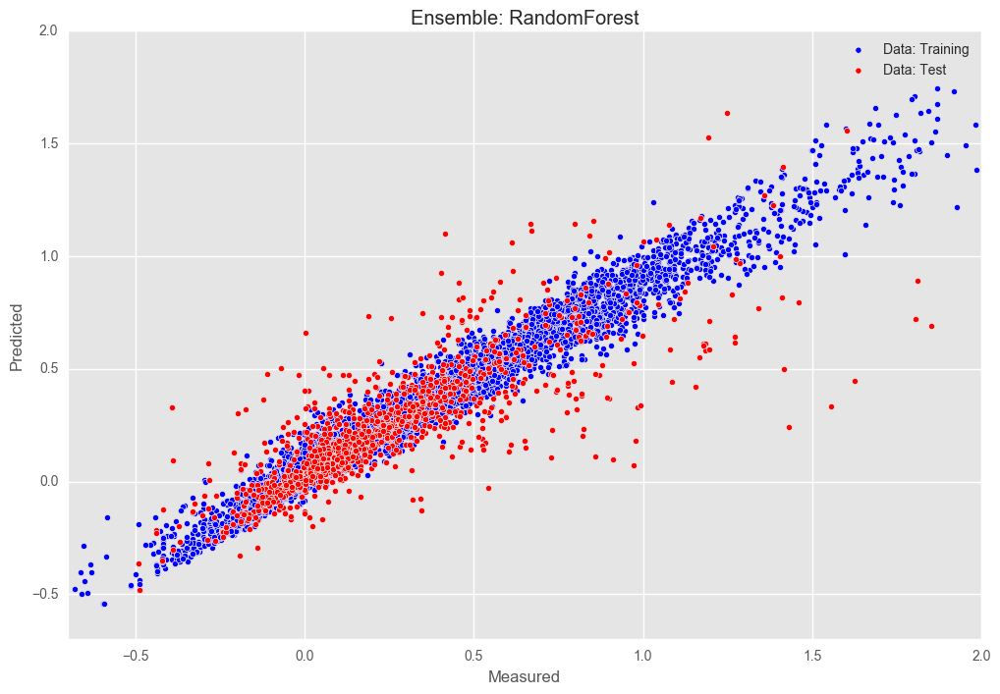

In [200]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.cross_validation import train_test_split

X_train, X_test, y_train, y_test = train_test_split(u, v, test_size=0.10, random_state=0)

max_depth = 120
regr_rf = RandomForestRegressor(n_estimators=2000, criterion='mse',max_depth=max_depth,
                                bootstrap=True, max_features='log2', random_state=5)
regr_rf.fit(X_train, y_train)

# Predict on new data
y_rf = regr_rf.predict(X_train)
y_rft = regr_rf.predict(X_test)

scr = regr_rf.score(X_train, y_train, sample_weight=None)
print('score:',scr)

# Plot the results
plt.figure().set_size_inches(12, 8)
plt.scatter(y_train, y_rf, c='b',label='Data: Training')
plt.scatter(y_test, y_rft, c='r' ,label='Data: Test')
plt.xlabel('Measured')
plt.ylabel('Predicted')
plt.title("Ensemble: RandomForest")
plt.ylim(ymin, ymax)
plt.xlim(ymin, ymax)
plt.legend()

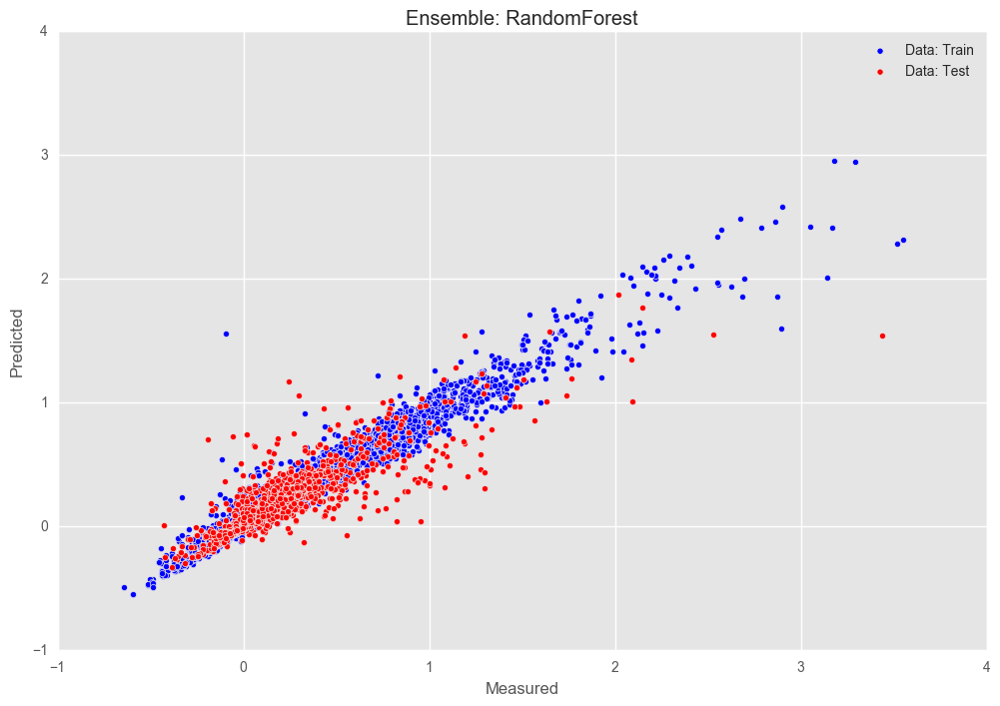

score: 0.497917096428


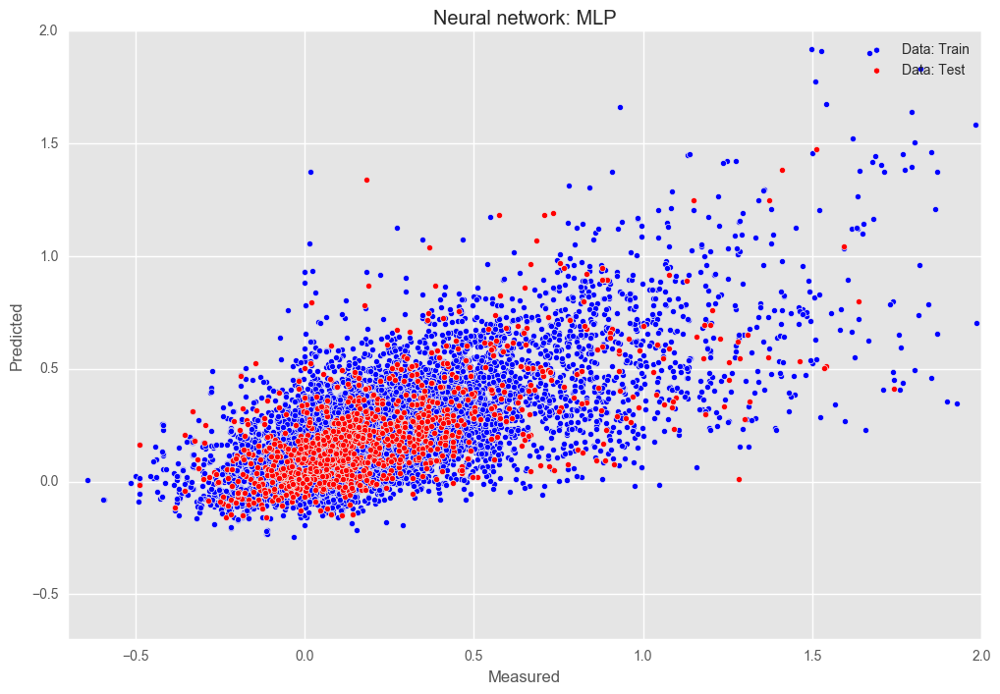

In [137]:
# Multi-layer Perception Neural network: MLP

from sklearn.neural_network import MLPRegressor

from sklearn.cross_validation import train_test_split

X_train, X_test, y_train, y_test = train_test_split(u, v, test_size=0.1, random_state=0)


regr_nnk = MLPRegressor(hidden_layer_sizes=(500, ), activation='relu', solver='lbfgs', 
                        alpha=0.0001, batch_size='auto', learning_rate='constant', 
                        learning_rate_init=0.001, power_t=0.5, max_iter=9000, 
                        shuffle=True, random_state=None, tol=0.0001, verbose=False, 
                        warm_start=False, momentum=0.9, nesterovs_momentum=True, 
                        early_stopping=False, validation_fraction=0.1, beta_1=0.9, 
                        beta_2=0.999, epsilon=1e-08)
regr_nnk.fit(X_train, y_train)

# Predict on new data
y_nnk = regr_nnk.predict(X_train)
y_nnkt = regr_nnk.predict(X_test)

scr = regr_nnk.score(X_train, y_train, sample_weight=None)
print('score:',scr)

# Plot the results
plt.figure().set_size_inches(12, 8)
plt.scatter(y_train, y_nnk, c='b',label='Data: Training')
plt.scatter(y_test, y_nnkt, c='r' ,label='Data: Test')
plt.xlabel('Measured')
plt.ylabel('Predicted')
plt.title("Neural network: MLP")
plt.ylim(ymin, ymax)
plt.xlim(ymin, ymax)
plt.legend()

In [330]:
dfk = dfb[(dfb['enthalpy_formation_atom'] <= 2.0) & (dfb['enthalpy_formation_atom'] >= -0.8)]

In [360]:
#dfb2 = dfb 
dfb.tail()

,compound,composition,density,energy_atom,enthalpy_formation_atom,natoms,nspecies,species,spin_atom,stoichiometry,species_pp_ZVAL,valence_cell_std,volume_atom,cx,cy,xFe,new_Features
258679,Fe1Zn2,"1,2",7.63690,-3.61293,0.049046,3,2,"Fe,Zn",0.76349,"0.333333333,0.666666667","14,12",32,13.5251,0.333333,0.666667,0.333333,"[0.0490463, 1065.4533333333334, 1831.333333333..."
258717,Zn2,2,7.17358,-1.24370,0.021885,2,1,Zn,0.00000,1,12,24,15.1342,1.000000,0.000000,1.000000,"[0.0218855, 692.68, 1180.0, 9.16, 70.0, 0.25, ..."
258812,Fe2,2,9.10054,-8.37341,0.081337,2,1,Fe,0.00000,1,14,16,10.1902,1.000000,0.000000,1.000000,"[0.0813375, 1811.0, 3134.0, 7.09, 170.0, 0.29,..."
258831,Zn2,2,7.14976,-1.26541,0.000177,2,1,Zn,0.00000,1,12,24,15.1846,1.000000,0.000000,1.000000,"[0.000177, 692.68, 1180.0, 9.16, 70.0, 0.25, 1..."
258850,Fe1Zn13,"1,13",7.38229,-1.80872,-0.029617,14,2,"Fe,Zn",0.00000,"0.0714285714,0.928571429","14,12",164,14.5531,0.071429,0.928571,0.071429,"[-0.029617200000000003, 772.5600000000001, 131..."


In [332]:
from pymatgen import Composition, Element, MPRester, periodic_table
def extract_more_Features(x):
    moreFeatures = []
    fraction = []
    fra = []
    wf = []
    mlt = []; atomic_mv = []; blt = []
    atomic_bm = []
    atomic_pr = []
    atomic_thc = []
    eneg = []
    
    for element in Composition(x[0]):
        comp=Composition(x[0])
        wf.append(comp.weight)
        fraction.append(Composition(x[0]).get_atomic_fraction(element)) # concentration
        fra.append(comp[element])  # natom
        mlt.append(element.melting_point)
        blt.append(element.boiling_point)
        atomic_mv.append(element.molar_volume) # molar volume
        atomic_bm.append(element.bulk_modulus) # bulk modulus
        atomic_pr.append(element.poissons_ratio) # poisson ratio
        atomic_thc.append(element.thermal_conductivity) # bulk modulus
        eneg.append(element.X)
        
    moreFeatures.append(x[4])    
    if fraction[0] ==1:
        aa =  fraction[0]*mlt[0]
        moreFeatures.append(float(aa))
        aa =  fraction[0]*blt[0]
        moreFeatures.append(float(aa))
        aa =  fraction[0]*atomic_mv[0]
        moreFeatures.append(float(aa))
        if atomic_bm[0] is None:
            atomic_bm[0]=0.0
        am = fraction[0]*atomic_bm[0] 
        moreFeatures.append(float(am))
        if atomic_pr[0] is None:
            atomic_pr[0]=0.0
#        print(element,atomic_pr[0])
        am = fraction[0]*atomic_pr[0] 
        moreFeatures.append(float(am))
        am = fraction[0]*atomic_thc[0] 
        moreFeatures.append(float(am))
        moreFeatures.append(float(eneg[0]))

    else:
        aa =  fraction[0]*mlt[0] + fraction[1]*mlt[1]
        moreFeatures.append(float(aa))
        aa =  fraction[0]*blt[0] + fraction[1]*blt[1]
        moreFeatures.append(float(aa))
        aa =  fraction[0]*atomic_mv[0] + fraction[1]*atomic_mv[1]
        moreFeatures.append(float(aa))
        if atomic_bm[0] is None:
            atomic_bm[0]=0.0
        if atomic_bm[1] is None:
            atomic_bm[1]=0.0
        am = fraction[0]*atomic_bm[0] + fraction[1]*atomic_bm[1]  
        moreFeatures.append(float(am))
        if atomic_pr[0] is None:
            atomic_pr[0]=0.0
        if atomic_pr[1] is None:
            atomic_pr[1]=0.0
        am = fraction[0]*atomic_pr[0] + fraction[1]*atomic_pr[1] 
        moreFeatures.append(float(am))
        am = fraction[0]*atomic_thc[0] + fraction[1]*atomic_thc[1] 
        moreFeatures.append(float(am))
        am = fraction[0]*eneg[0] + fraction[1]*eneg[1] 
        moreFeatures.append(float(am))

    aa =    wf[0] 
    moreFeatures.append(float(aa))
    moreFeatures.append(x[2])
    moreFeatures.append(x[8])
    moreFeatures.append(x[11])
    moreFeatures.append(x[12])
    moreFeatures.append(x[15])

    return list(moreFeatures)


dfk['new_Features'] = dfk.apply(extract_more_Features, axis=1)

dfk.head()

/Users/moshiour/anaconda/lib/python3.5/site-packages/ipykernel/__main__.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


,compound,composition,density,energy_atom,enthalpy_formation_atom,natoms,nspecies,species,spin_atom,stoichiometry,species_pp_ZVAL,valence_cell_std,volume_atom,cx,cy,xFe,new_Features
0,Fe1,1,8.85851,-8.29881,0.155943,1,1,Fe,0.921567,1,14,8,10.4686,1.000000,0.000000,1.000000,"[0.155943, 1811.0, 3134.0, 7.09, 170.0, 0.29, ..."
19,Ag2Fe1,"2,1",9.29710,-4.41071,0.292662,3,2,"Ag,Fe",0.963026,"0.666666667,0.333333333","11,14",30,16.1690,0.666667,0.333333,0.333333,"[0.292662, 1426.9533333333334, 2668.0, 9.20999..."
38,Ag1Fe3,"1,3",8.48051,-6.70721,0.340776,4,2,"Ag,Fe",2.000280,"0.25,0.75","11,14",35,13.4817,0.250000,0.750000,0.750000,"[0.340776, 1666.9825, 2959.25, 7.885, 152.5, 0..."
57,Fe2,2,7.74657,-8.26798,0.186767,2,1,Fe,2.557380,1,14,16,11.9713,1.000000,0.000000,1.000000,"[0.18676700000000002, 1811.0, 3134.0, 7.09, 17..."
76,Ag1Fe1,"1,1",8.96160,-5.23650,0.404718,2,2,"Ag,Fe",1.410700,"0.5,0.5","11,14",19,15.1678,0.500000,0.500000,0.500000,"[0.40471799999999997, 1522.9650000000001, 2784..."


In [333]:
df3=pd.DataFrame(dfk.new_Features.tolist(), )
df3.head(10)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,0.155943,1811.000000,3134.00,7.090,170.000000,0.290000,80.000000,1.830000,55.8450,8.85851,0.921567,8,10.4686,1.000000
1,0.292662,1426.953333,2668.00,9.210,123.333333,0.343333,313.333333,1.896667,271.5814,9.29710,0.963026,30,16.1690,0.333333
2,0.340776,1666.982500,2959.25,7.885,152.500000,0.310000,167.500000,1.855000,275.4032,8.48051,2.000280,35,13.4817,0.750000
3,0.186767,1811.000000,3134.00,7.090,170.000000,0.290000,80.000000,1.830000,111.6900,7.74657,2.557380,16,11.9713,1.000000
4,0.404718,1522.965000,2784.50,8.680,135.000000,0.330000,255.000000,1.880000,163.7132,8.96160,1.410700,19,15.1678,0.500000
5,0.003770,1234.930000,2435.00,10.270,100.000000,0.370000,430.000000,1.930000,215.7364,10.01160,0.000000,22,17.8912,0.000000
6,0.356378,1666.982500,2959.25,7.885,152.500000,0.310000,167.500000,1.855000,275.4032,8.38965,2.000530,35,13.6277,0.750000
7,0.391922,1522.965000,2784.50,8.680,135.000000,0.330000,255.000000,1.880000,327.4264,8.94575,1.416600,38,15.1947,0.500000
8,0.303215,1378.947500,2609.75,9.475,117.500000,0.350000,342.500000,1.905000,379.4496,9.46282,0.738813,41,16.6466,0.250000
9,0.390556,1522.965000,2784.50,8.680,135.000000,0.330000,255.000000,1.880000,327.4264,9.03052,1.392300,38,15.0520,0.500000


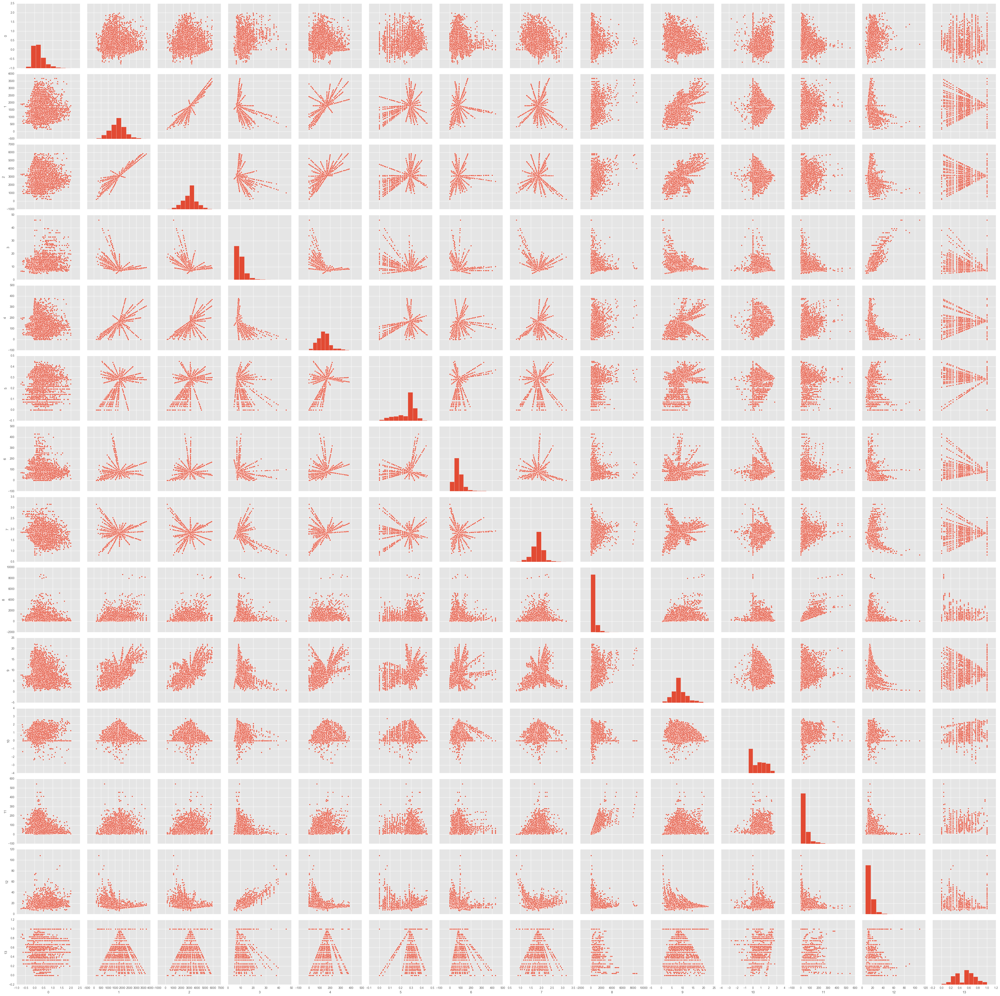

In [334]:
sns.pairplot(df3, palette="coolwarm",size=3.5)

In [363]:
ua = df3.values
va = dfk['enthalpy_formation_atom'].ravel()

In [364]:
ua.shape,va.shape

((12399, 14), (12399,))

score: 0.945531824256


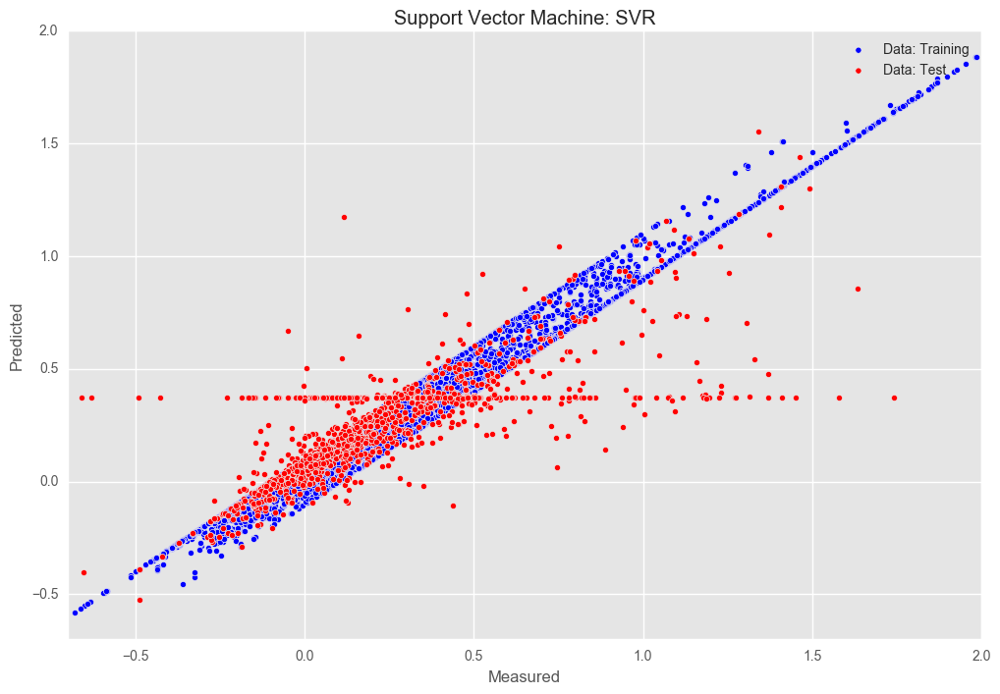

In [338]:
# Support vector machine

from sklearn.svm import SVR

import matplotlib.pyplot as plt
from sklearn.cross_validation import train_test_split

X_train, X_test, y_train, y_test = train_test_split(ua, va, test_size=0.10, random_state=7)
#############################################################################
# Fit regression model
svr = SVR(kernel='rbf', C=1e3, gamma=0.1,epsilon=0.1,cache_size=500)

svr.fit(X_train, y_train)

y_svr = svr.predict(X_train)

y_svrt = svr.predict(X_test)

scr = svr.score(X_train, y_train, sample_weight=None)
print('score:',scr)
######################################
# Plot
plt.figure().set_size_inches(12, 8)
plt.scatter(y_train, y_svr,c='b',label='Data: Training')
plt.scatter(y_test, y_svrt,c='r' ,label='Data: Test')
plt.xlabel('Measured')
plt.ylabel('Predicted')
plt.title("Support Vector Machine: SVR")
plt.ylim(ymin, ymax)
plt.xlim(ymin, ymax)
plt.legend()

score: 0.998023258882


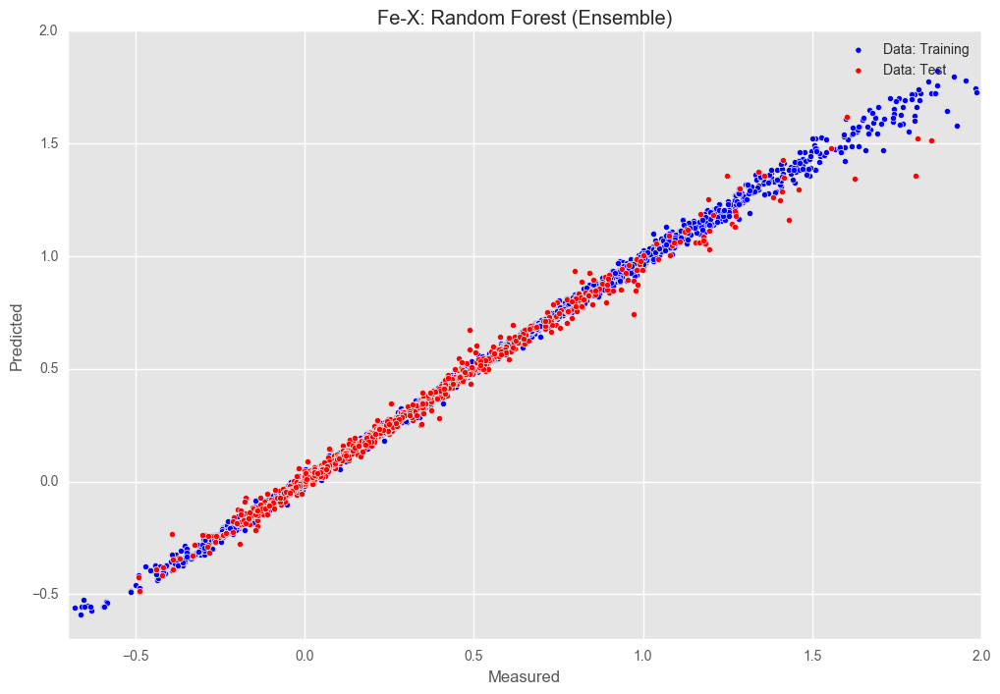

In [341]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.cross_validation import train_test_split

X_train, X_test, y_train, y_test = train_test_split(ua, va, test_size=0.10, random_state=0)

max_depth = 220
regr_rf = RandomForestRegressor(n_estimators=2000, criterion='mse',max_depth=max_depth,
                                bootstrap=True, max_features='log2', random_state=5)
regr_rf.fit(X_train, y_train)

# Predict on new data
y_rf = regr_rf.predict(X_train)
y_rft = regr_rf.predict(X_test)

scr = regr_rf.score(X_train, y_train, sample_weight=None)
print('score:',scr)

# Plot the results
plt.figure().set_size_inches(12, 8)
plt.scatter(y_train, y_rf, c='b',label='Data: Training')
plt.scatter(y_test, y_rft, c='r' ,label='Data: Test')
plt.xlabel('Measured (DFT)')
plt.ylabel('Predicted')
plt.title("Fe-X: Random Forest (Ensemble)")
plt.ylim(ymin, ymax)
plt.xlim(ymin, ymax)
plt.legend()
plt.savefig('ML_FeX.png',dpi=500,format='PNG')

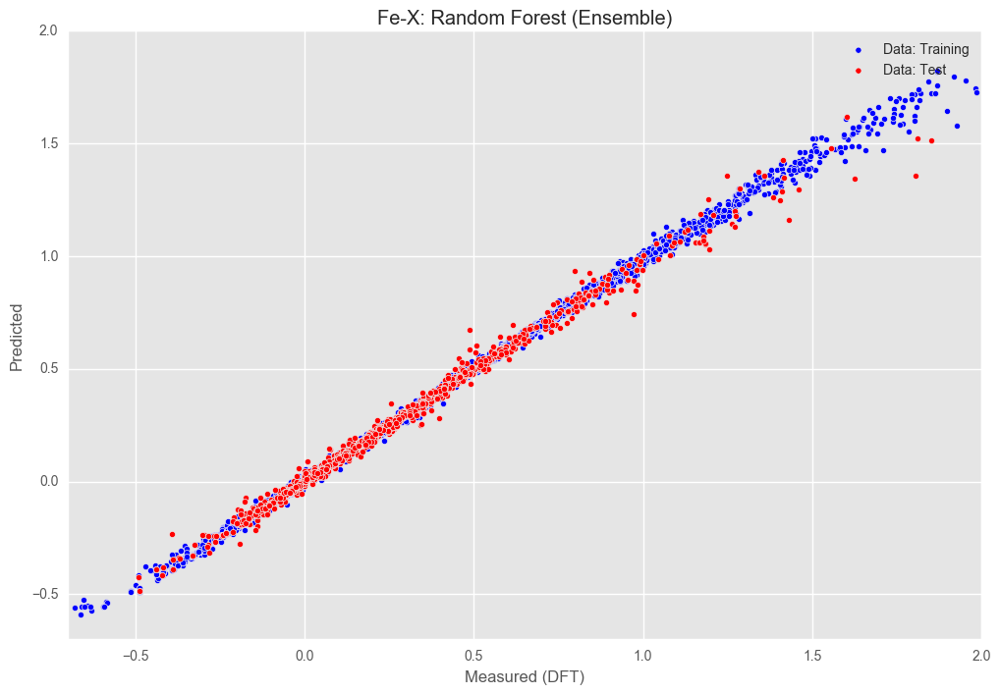

In [342]:
# Plot the results
plt.figure().set_size_inches(12, 8)
plt.scatter(y_train, y_rf, c='b',label='Data: Training')
plt.scatter(y_test, y_rft, c='r' ,label='Data: Test')
plt.xlabel('Measured (DFT)')
plt.ylabel('Predicted')
plt.title("Fe-X: Random Forest (Ensemble)")
plt.ylim(ymin, ymax)
plt.xlim(ymin, ymax)
plt.legend()
plt.savefig('ML_FeX.png',dpi=500,format='PNG')

In [343]:
# Bias-Variance decomposition
from sklearn.learning_curve import validation_curve

def rms_error(model, X, y):
    y_pred = model.predict(X)
    return np.sqrt(np.mean((y - y_pred) ** 2))

param_range = [20,300,600, 1000]
val_train, val_test = validation_curve(RandomForestRegressor(), ua, va,         
                                    param_name="n_estimators", param_range=param_range,
                                       cv=10, scoring=rms_error, n_jobs=1)

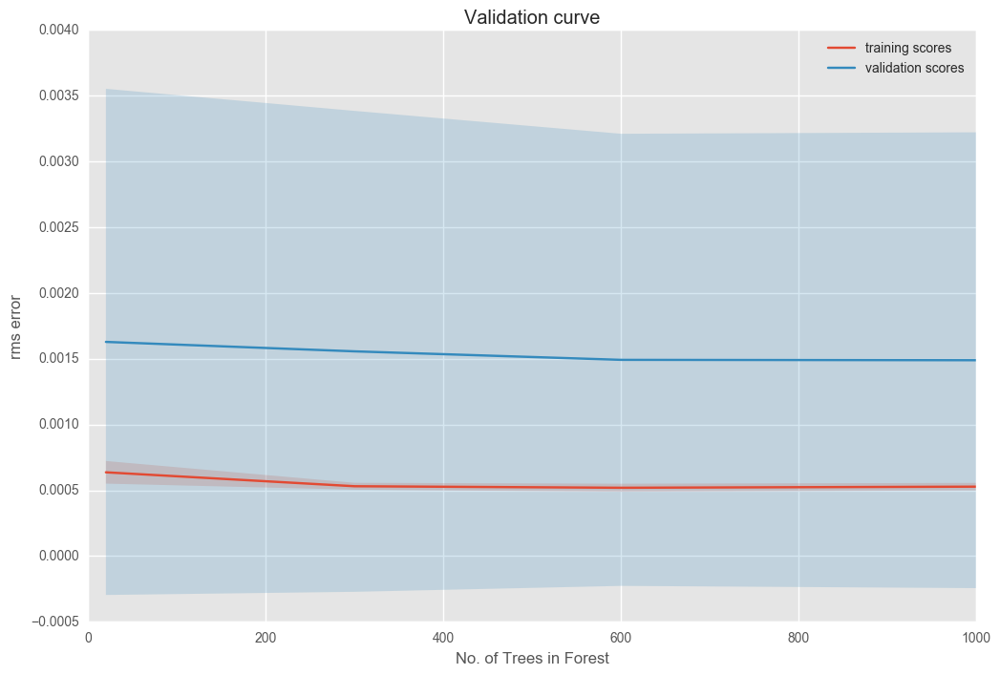

In [344]:
plt.figure().set_size_inches(12, 8)
def plot_with_err(x, data, **kwargs):
    mu, std = data.mean(1), data.std(1)
    lines = plt.plot(x, mu, '-', **kwargs)
    plt.fill_between(x, mu - std, mu + std, edgecolor='none',
                     facecolor=lines[0].get_color(), alpha=0.2)
    
plot_with_err(param_range, val_train, label='training scores')
plot_with_err(param_range, val_test, label='validation scores')
plt.xlabel('No. of Trees in Forest'); plt.ylabel('rms error')
plt.title("Validation curve")
plt.legend()
plt.savefig('vc_FeX.png',dpi=500,format='PNG')

In [347]:
from sklearn.learning_curve import learning_curve

def plot_learning_curve(max_depth=250):
    train_sizes = np.linspace(0.02, 1.0, 10.0)
    N_train, val_train, val_test = learning_curve(RandomForestRegressor(n_estimators=1000, 
                                            criterion='mse',max_depth=max_depth,
                                            bootstrap=True,max_features='log2',random_state=5),
                                    ua, va, train_sizes, cv=5, scoring=rms_error)
    plot_with_err(N_train, val_train, label='training scores')
    plot_with_err(N_train, val_test, label='validation scores')
    plt.xlabel('Training Set Size'); plt.ylabel('rms error')
#    plt.ylim(0, 1.5)
    plt.title("Learning curve")
    plt.legend()
    plt.savefig('lc_FeX.png',dpi=500,format='PNG')

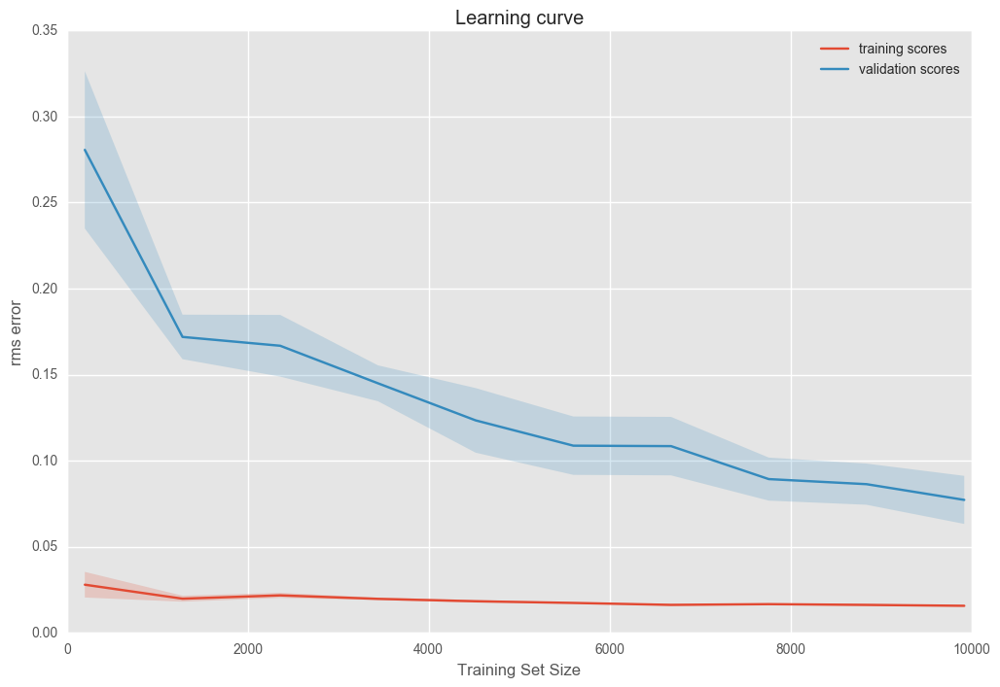

In [348]:
plt.figure().set_size_inches(12, 8)
plot_learning_curve(250)

score: 0.984104673263


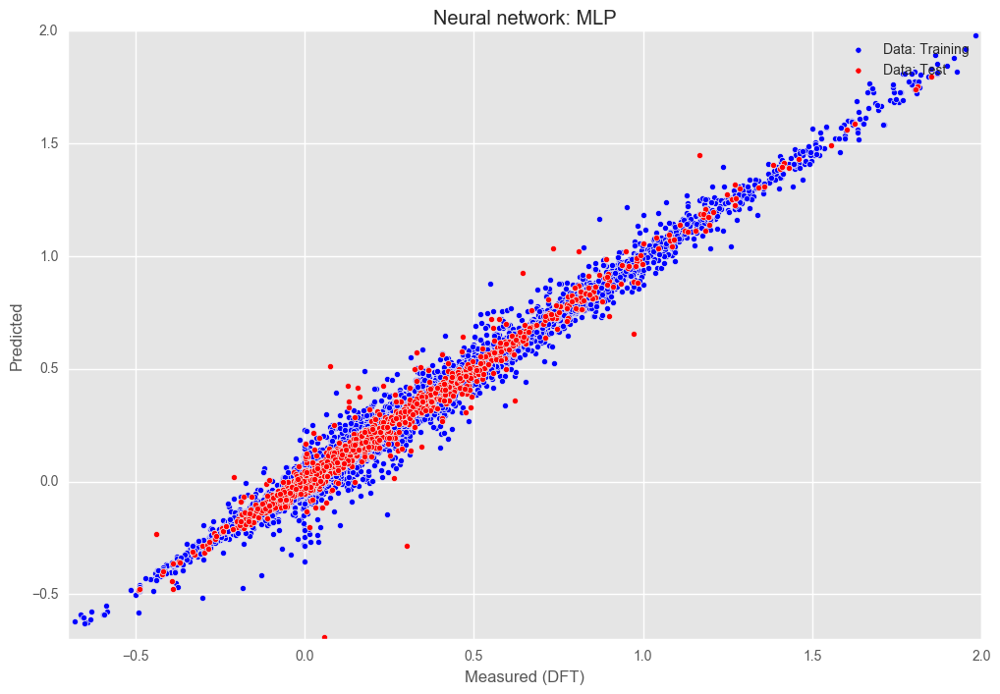

In [350]:
# Multi-layer Perception Neural network: MLP

from sklearn.neural_network import MLPRegressor

from sklearn.cross_validation import train_test_split

X_train, X_test, y_train, y_test = train_test_split(ua, va, test_size=0.1, random_state=0)


regr_nnk = MLPRegressor(hidden_layer_sizes=(800, ), activation='relu', solver='lbfgs', 
                        alpha=0.0001, batch_size='auto', learning_rate='constant', 
                        learning_rate_init=0.001, power_t=0.5, max_iter=15000, 
                        shuffle=True, random_state=None, tol=0.0001, verbose=False, 
                        warm_start=False, momentum=0.9, nesterovs_momentum=True, 
                        early_stopping=False, validation_fraction=0.1, beta_1=0.9, 
                        beta_2=0.999, epsilon=1e-08)
regr_nnk.fit(X_train, y_train)

# Predict on new data
y_nnk = regr_nnk.predict(X_train)
y_nnkt = regr_nnk.predict(X_test)

scr = regr_nnk.score(X_train, y_train, sample_weight=None)
print('score:',scr)

# Plot the results
plt.figure().set_size_inches(12, 8)
plt.scatter(y_train, y_nnk, c='b',label='Data: Training')
plt.scatter(y_test, y_nnkt, c='r' ,label='Data: Test')
plt.xlabel('Measured (DFT)')
plt.ylabel('Predicted')
plt.title("Neural network: MLP")
plt.ylim(ymin, ymax)
plt.xlim(ymin, ymax)
plt.legend()
plt.savefig('ML-mlp-FeX.png',dpi=500,format='PNG')

In [355]:
from sklearn.learning_curve import validation_curve

def rms_error(model, X, y):
    y_pred = model.predict(X)
    return np.sqrt(np.mean((y - y_pred) ** 2))

param_range = [20,100,200,500,900]
val_train, val_test = validation_curve(MLPRegressor(), ua, va,         
                                    param_name="hidden_layer_sizes", param_range=param_range,
                                       cv=10, scoring=rms_error, n_jobs=1)

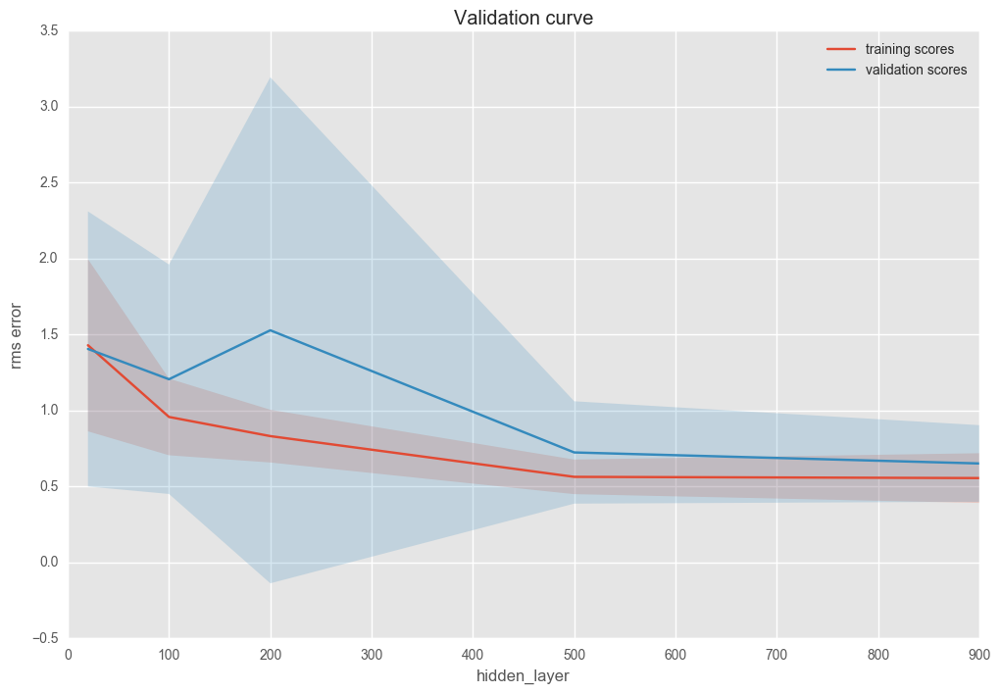

In [356]:
plt.figure().set_size_inches(12, 8)
def plot_with_err(x, data, **kwargs):
    mu, std = data.mean(1), data.std(1)
    lines = plt.plot(x, mu, '-', **kwargs)
    plt.fill_between(x, mu - std, mu + std, edgecolor='none',
                     facecolor=lines[0].get_color(), alpha=0.2)
    
plot_with_err(param_range, val_train, label='training scores')
plot_with_err(param_range, val_test, label='validation scores')
plt.xlabel('hidden_layer'); plt.ylabel('rms error')
plt.title("Validation curve")
plt.legend()
plt.savefig('vc-mlp-FeX.png',dpi=500,format='PNG')

In [365]:
from sklearn.learning_curve import learning_curve

def plot_learning_curve(miter=100):
    train_sizes = np.linspace(0.02, 1.0, 10.0)
    N_train, val_train, val_test = learning_curve(MLPRegressor(hidden_layer_sizes=(800, ), activation='relu', solver='lbfgs', 
                        alpha=0.0001, batch_size='auto', learning_rate='constant', 
                        learning_rate_init=0.001, power_t=0.5, max_iter=miter, shuffle=True, 
                        random_state=None, tol=0.0001, verbose=False, warm_start=False, 
                        momentum=0.9, nesterovs_momentum=True, early_stopping=False, 
                        validation_fraction=0.1, beta_1=0.9, beta_2=0.999, epsilon=1e-08),
                                                  ua, va, train_sizes, cv=10,
                                                  scoring=rms_error)
    plot_with_err(N_train, val_train, label='training scores')
    plot_with_err(N_train, val_test, label='validation scores')
    plt.xlabel('Training Set Size'); plt.ylabel('rms error')
    plt.ylim(0, 3)
    plt.title("Learning curve")
    plt.legend()
    plt.savefig('lc-mlp-FeX.png',dpi=500,format='PNG')

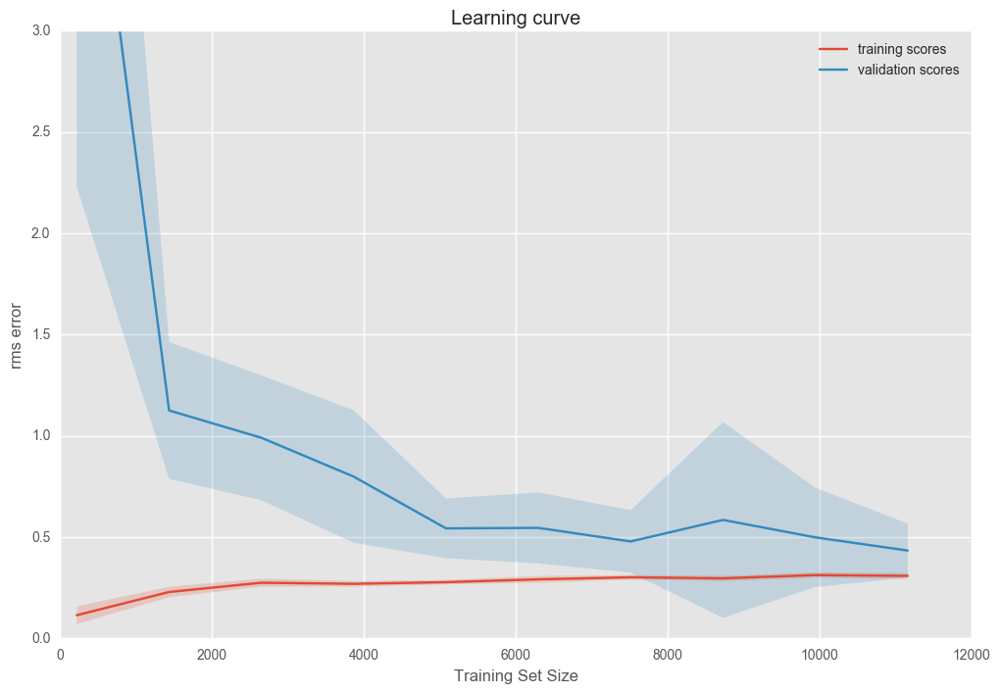

In [366]:
plt.figure().set_size_inches(12, 8)
plot_learning_curve(1000)